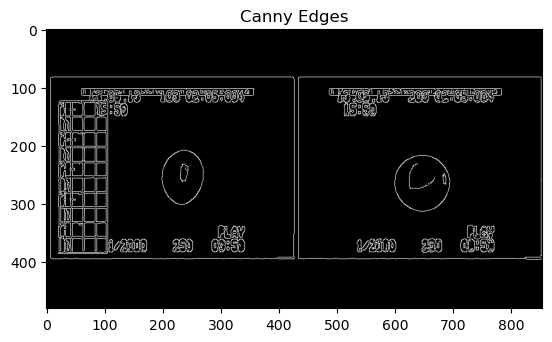

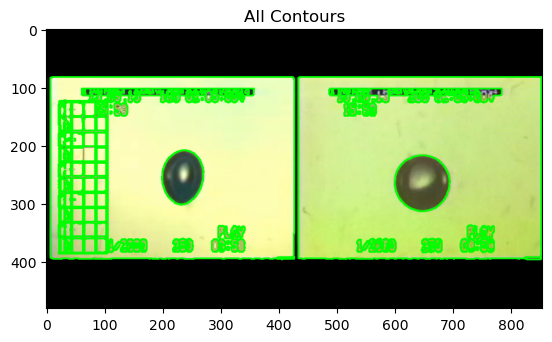

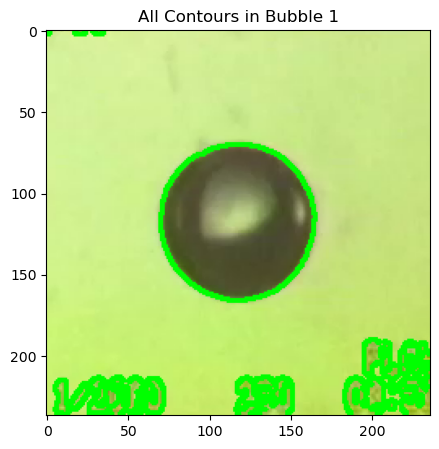

Bubble 1 Largest Areas: [7118.0, 128.5, 91.0]


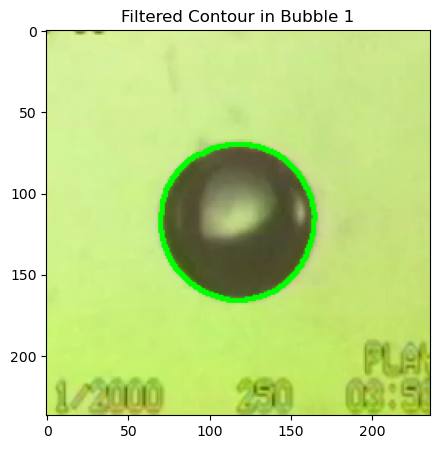

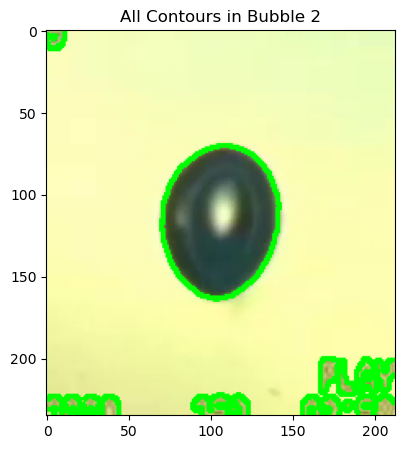

Bubble 2 Largest Areas: [5120.0, 58.0, 20.0]


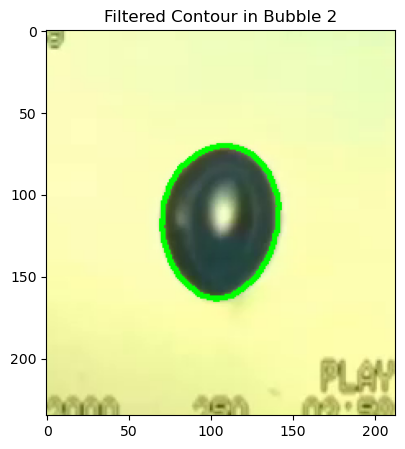

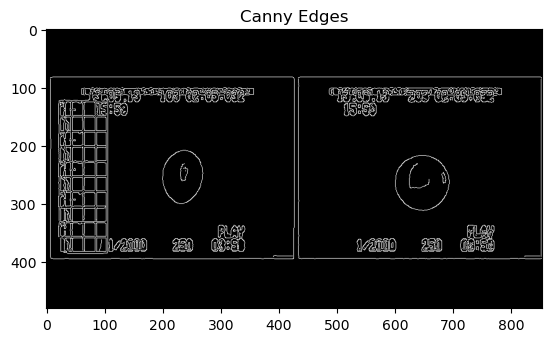

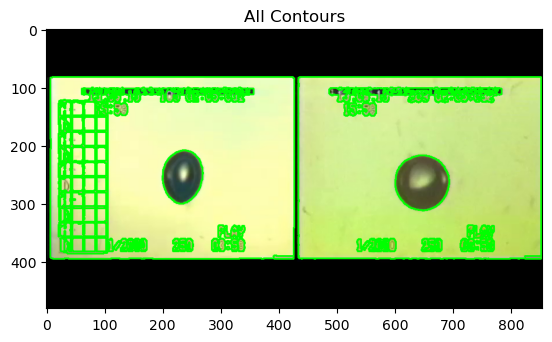

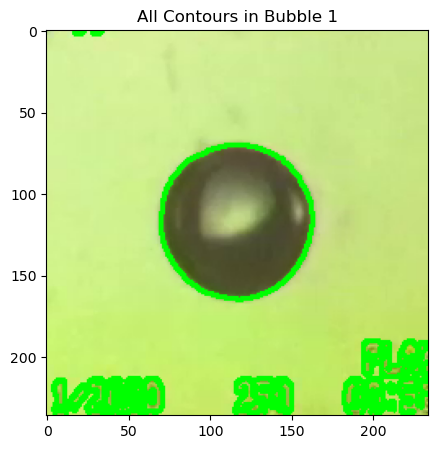

Bubble 1 Largest Areas: [6875.5, 64.5, 41.0]


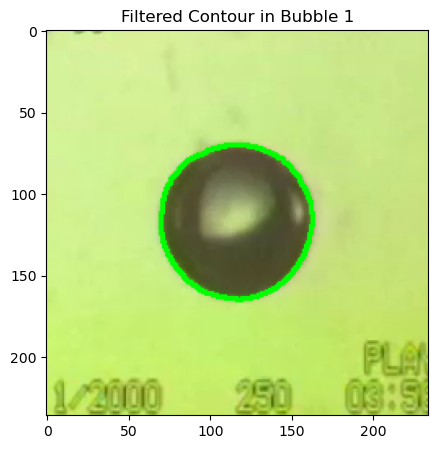

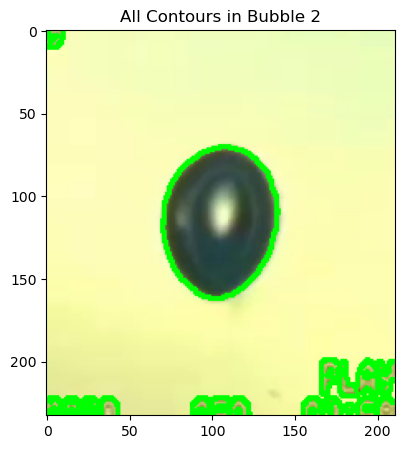

Bubble 2 Largest Areas: [4879.5, 34.0, 19.0]


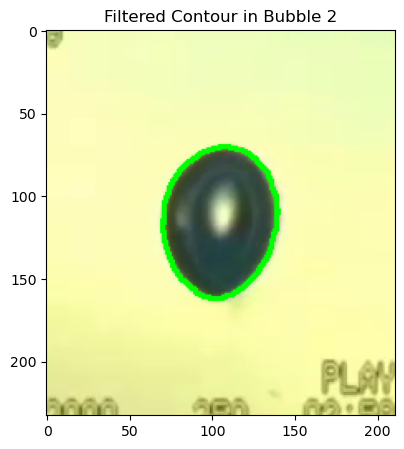

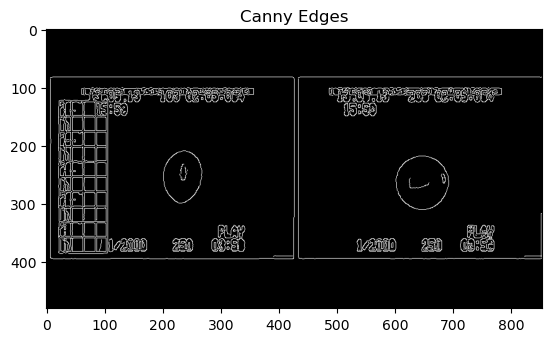

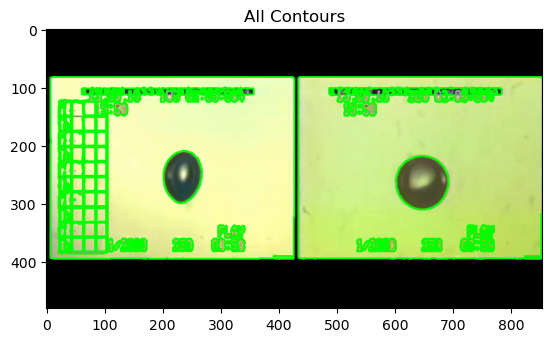

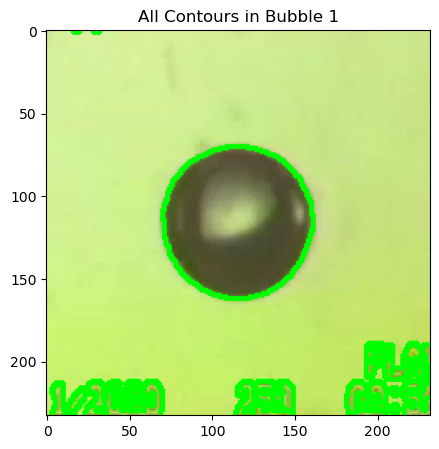

Bubble 1 Largest Areas: [6516.5, 171.5, 54.5]


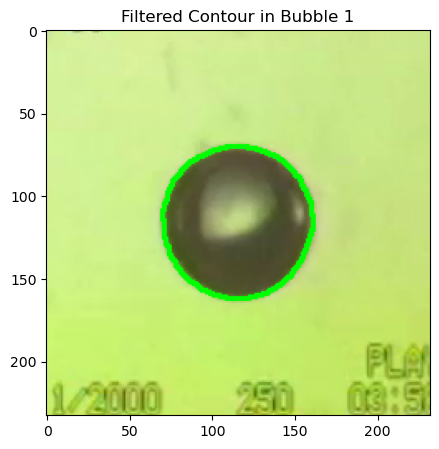

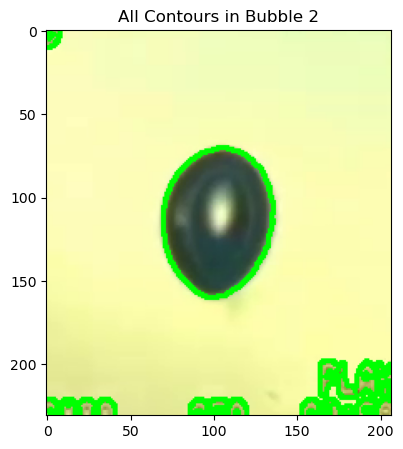

Bubble 2 Largest Areas: [4535.5, 38.0, 34.0]


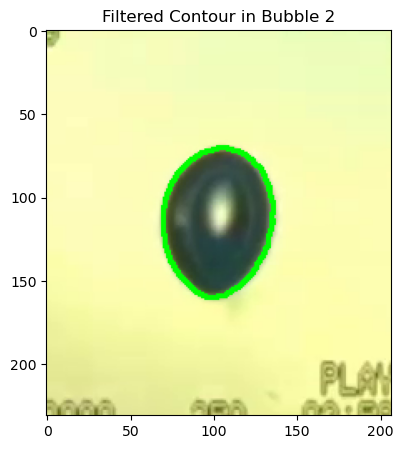

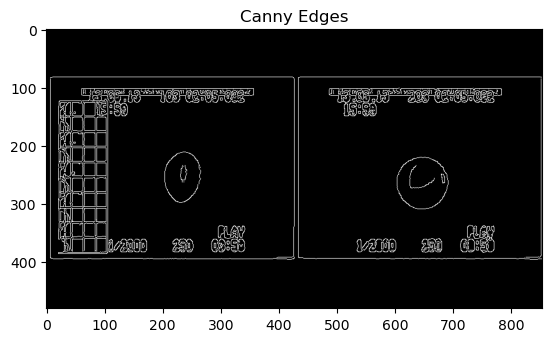

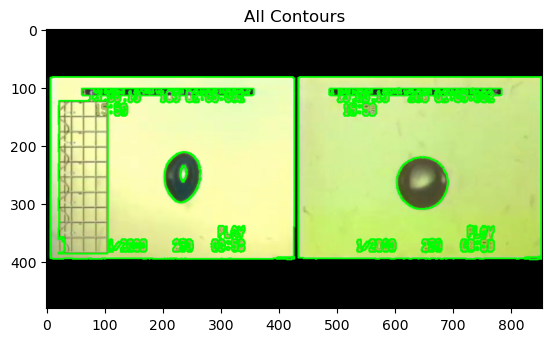

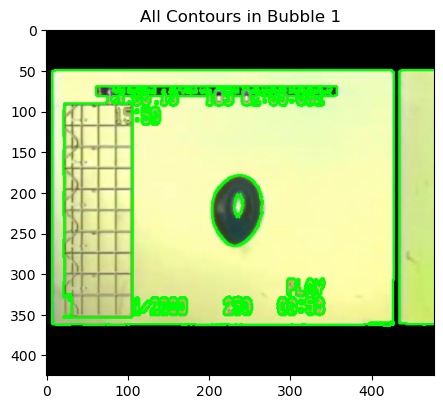

Bubble 1 Largest Areas: [22479.0, 370.0, 352.5]


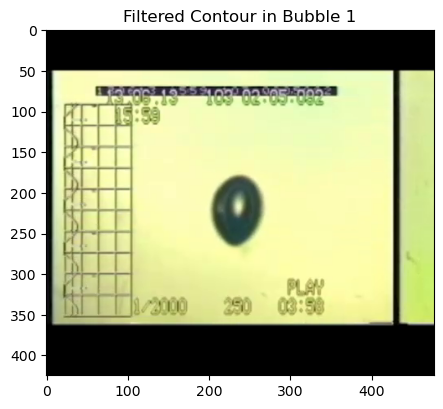

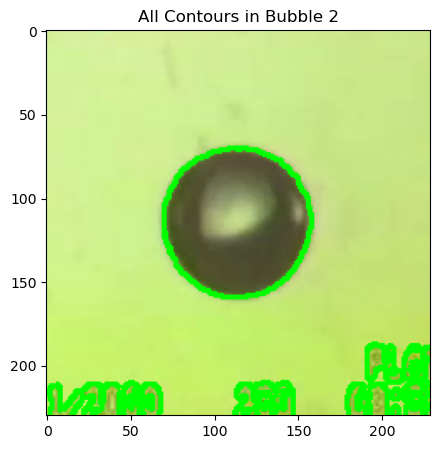

Bubble 2 Largest Areas: [6136.5, 65.5, 35.5]


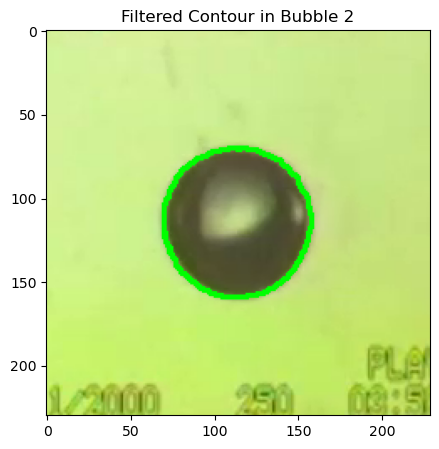

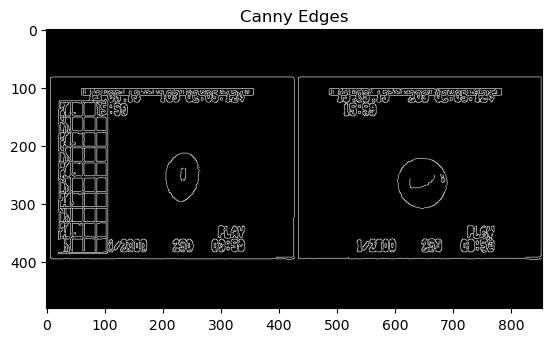

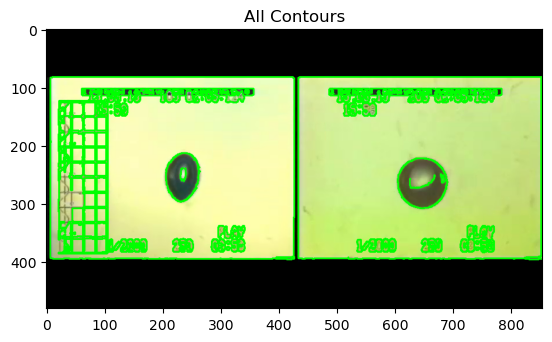

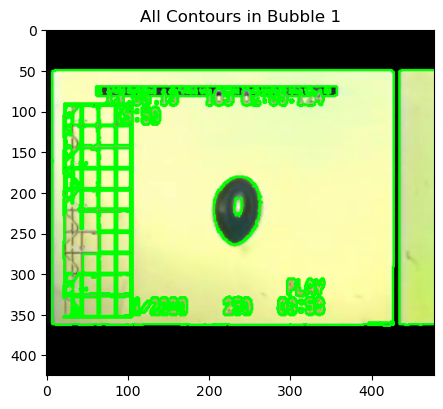

Bubble 1 Largest Areas: [5849.0, 847.5, 707.5]


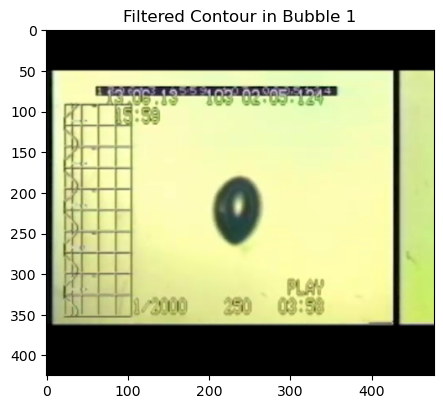

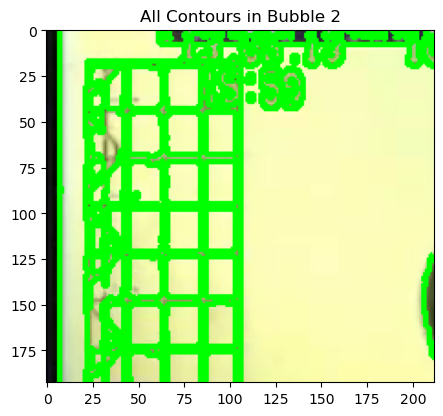

Bubble 2 Largest Areas: [1522.5, 847.5, 707.5]


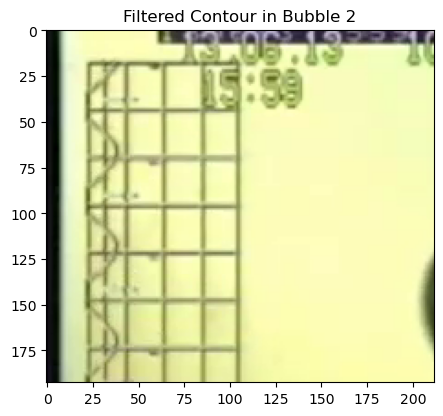

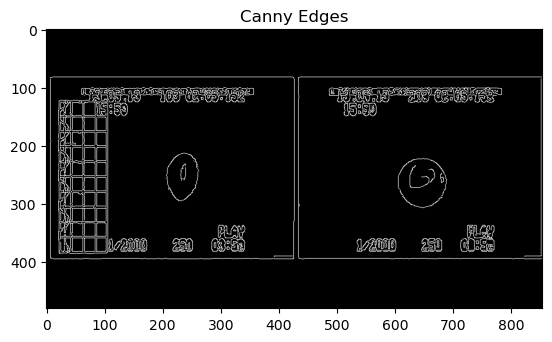

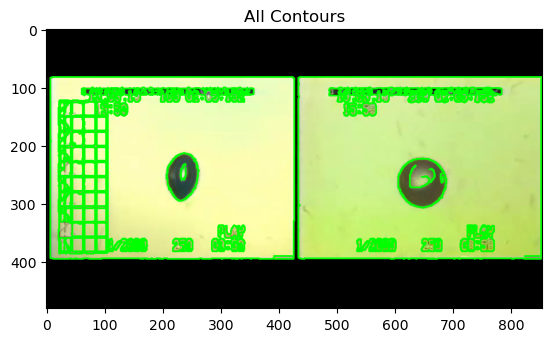

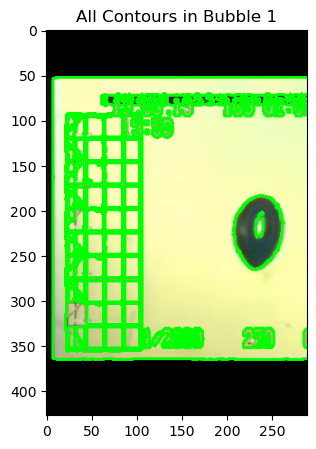

Bubble 1 Largest Areas: [3878.0, 833.0, 737.5]


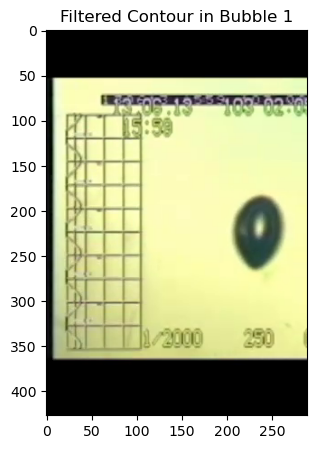

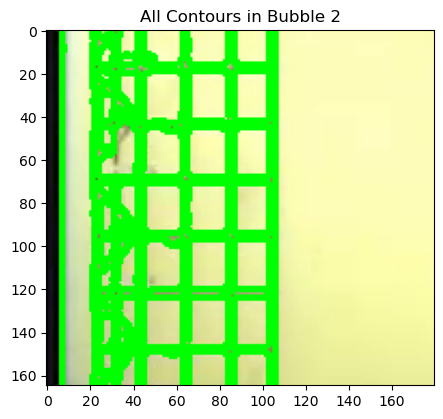

Bubble 2 Largest Areas: [833.0, 634.5, 548.0]


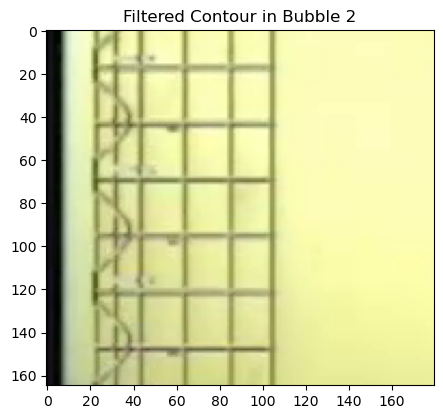

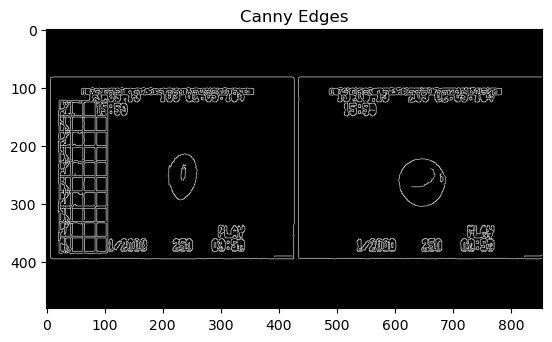

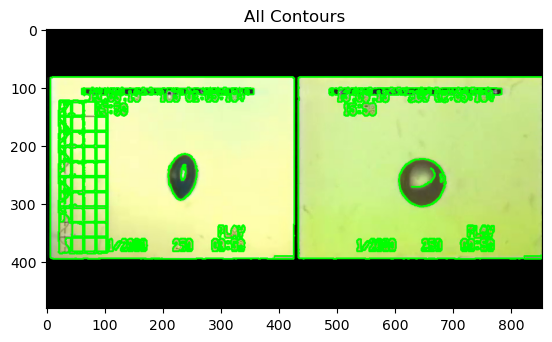

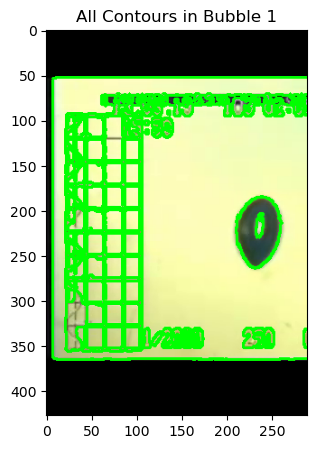

Bubble 1 Largest Areas: [3518.0, 782.0, 742.5]


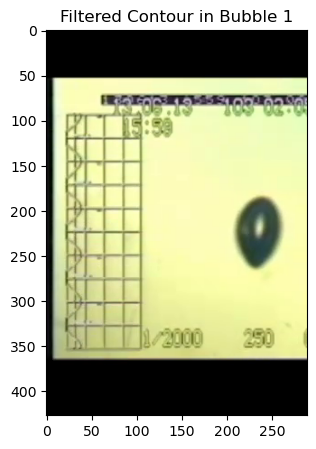

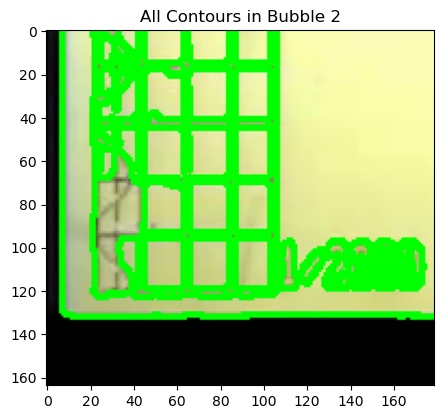

Bubble 2 Largest Areas: [1142.0, 782.0, 421.0]


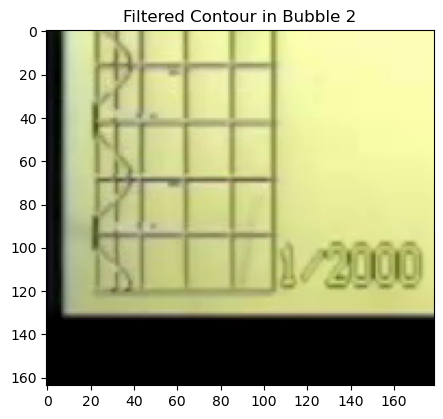

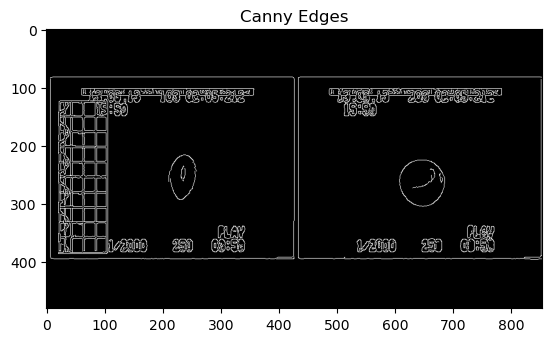

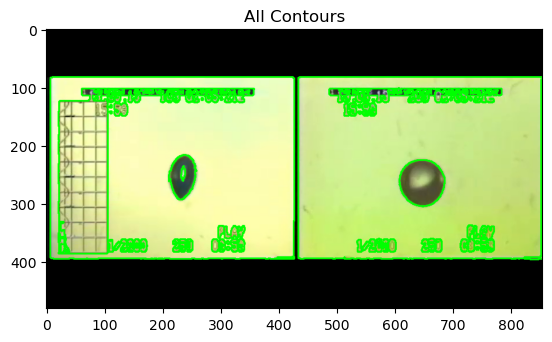

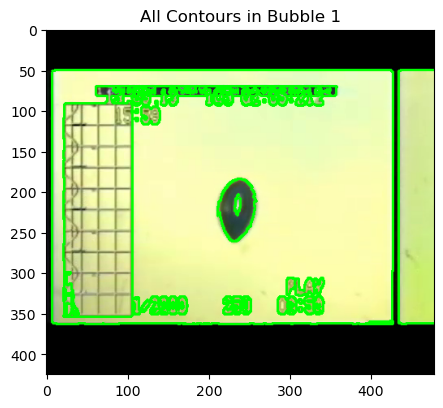

Bubble 1 Largest Areas: [22491.5, 451.0, 381.0]


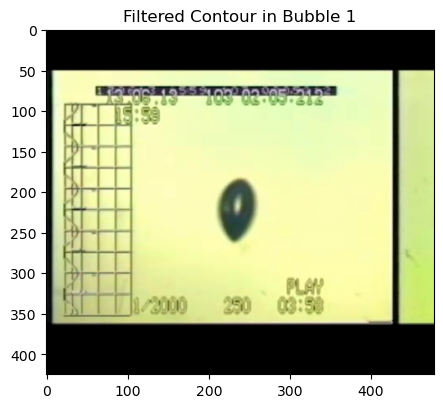

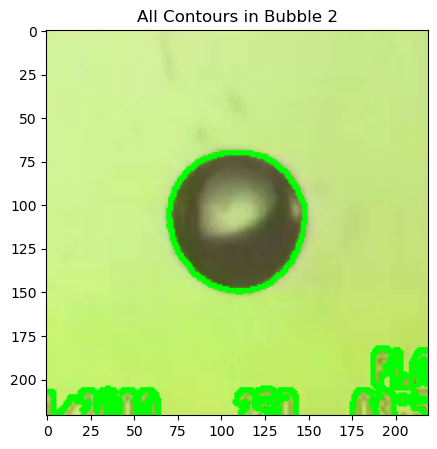

Bubble 2 Largest Areas: [4839.0, 18.5, 18.5]


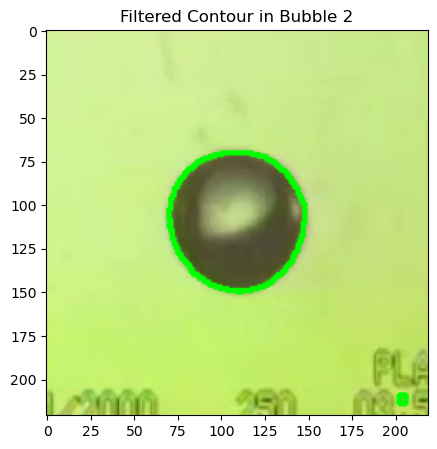

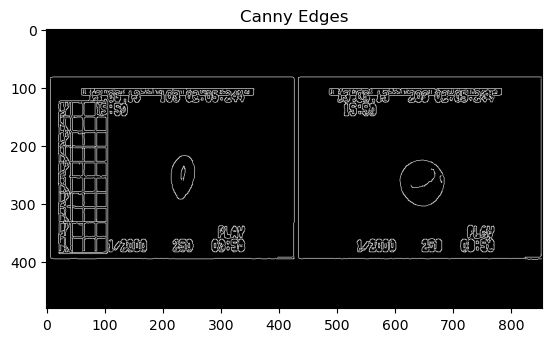

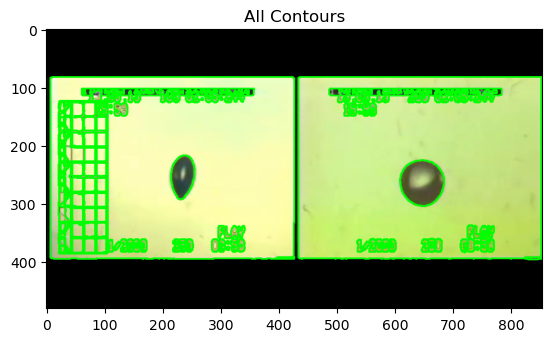

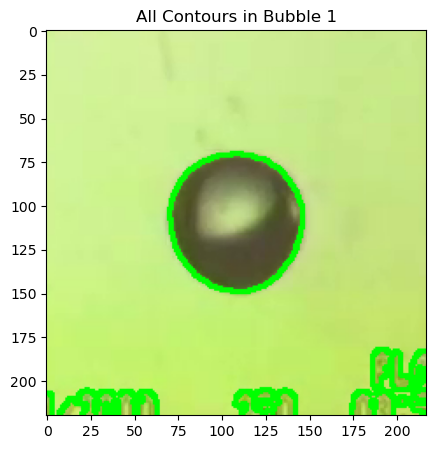

Bubble 1 Largest Areas: [4662.0, 160.5, 22.0]


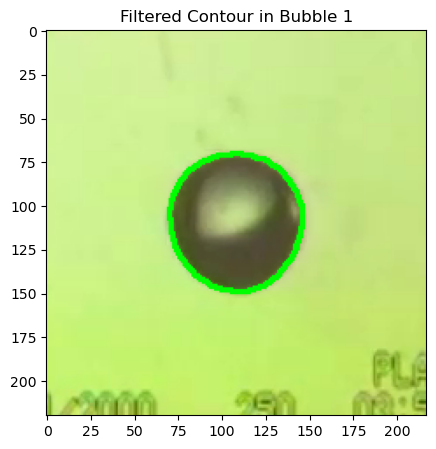

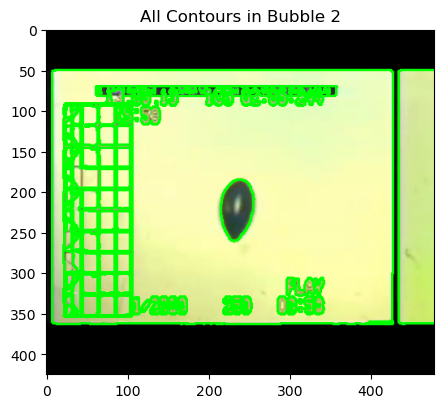

Bubble 2 Largest Areas: [4189.5, 2297.0, 820.0]


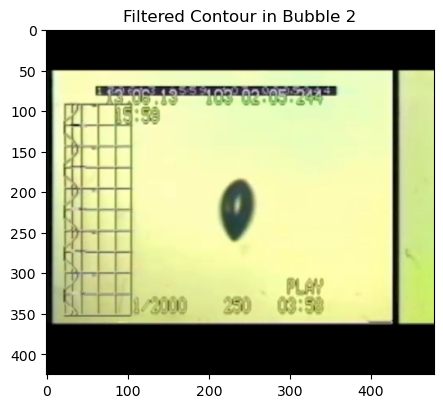

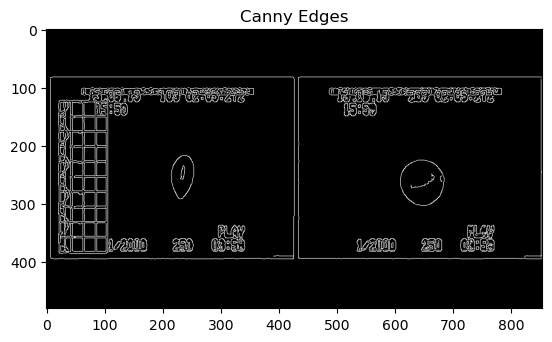

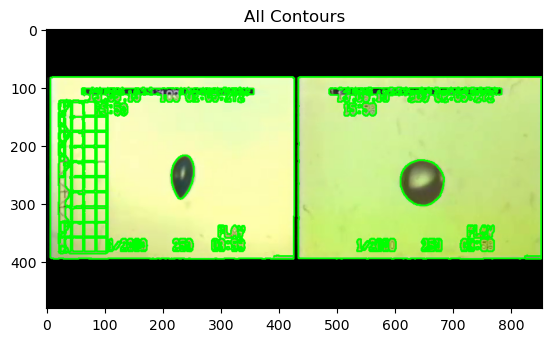

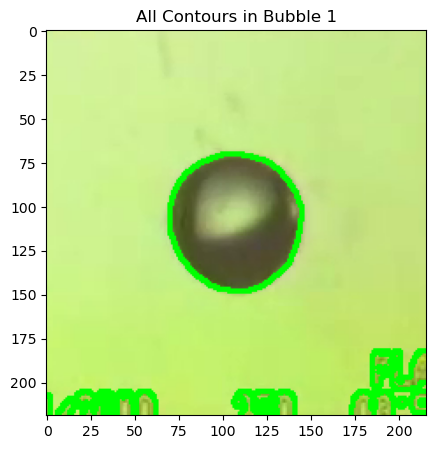

Bubble 1 Largest Areas: [4583.5, 43.0, 17.5]


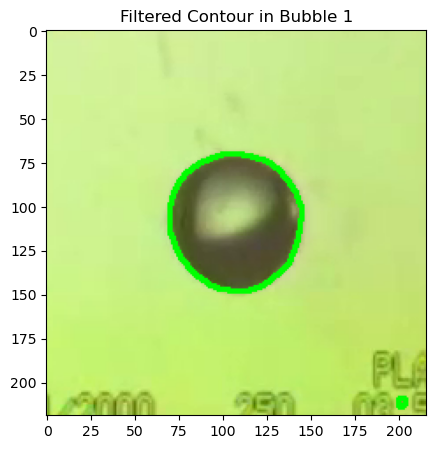

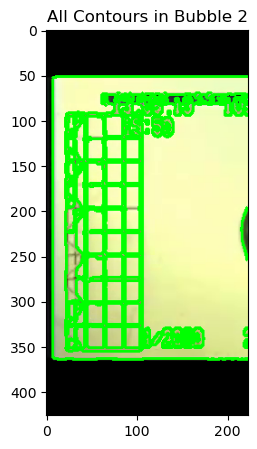

Bubble 2 Largest Areas: [3243.5, 1155.0, 432.0]


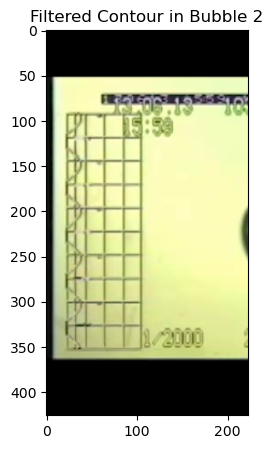

In [40]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math

def find_bubbles(frame, margin=70):
    # グレースケール変換
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # ガウシアンフィルタでノイズ除去
    # blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    # 小さなぼかし効果
    blurred = cv2.GaussianBlur(gray, (3, 3), 0)

    # 中程度のぼかし効果
    # blurred = cv2.GaussianBlur(gray, (5, 5), 1)

    # 強いぼかし効果
    # blurred = cv2.GaussianBlur(gray, (9, 9), 2)

    # Cannyエッジ検出
    edged = cv2.Canny(blurred, 30, 150)
    # Cannyエッジ検出の結果を表示
    plt.imshow(edged, cmap='gray')
    plt.title('Canny Edges')
    plt.show()

    # 輪郭検出
    contours, _ = cv2.findContours(edged.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # すべての輪郭を描画して確認
    all_contours_frame = frame.copy()
    cv2.drawContours(all_contours_frame, contours, -1, (0, 255, 0), 2)
    plt.imshow(cv2.cvtColor(all_contours_frame, cv2.COLOR_BGR2RGB))
    plt.title('All Contours')
    plt.show()


    # 面積が大きい輪郭を見つける
    largest_contours = sorted(contours, key=cv2.contourArea, reverse=True)[:2]  # 最大2つの輪郭を取得

    # 関心領域のリスト
    rois = []

    for contour in largest_contours:
        if cv2.contourArea(contour) > 100:  # 最小面積を設定
            x, y, w, h = cv2.boundingRect(contour)
            # マージンを追加してROIを拡大
            x = max(x - margin, 0)
            y = max(y - margin, 0)
            w = min(w + 2 * margin, frame.shape[1] - x)
            h = min(h + 2 * margin, frame.shape[0] - y)
            roi = frame[y:y+h, x:x+w]
            rois.append(roi)

    return rois

    
def extract_contours_from_roi(roi, num_contours=3):
    """
    関心領域（ROI）から輪郭を検出する関数。
    :param roi: 気泡が含まれる関心領域（ROI）
    :return: 検出された輪郭のリスト
    """
    # ROIをグレースケールに変換
    gray = cv2.cvtColor(roi, cv2.COLOR_BGR2GRAY)
    
    # ノイズ削減のためのぼかし
    blurred = cv2.GaussianBlur(gray, (3, 3), 0)
    
    # 二値化
    # _, binary = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    # Cannyエッジ検出
    edged = cv2.Canny(blurred, 30, 150)
    
    # 輪郭検出
    contours, _ = cv2.findContours(edged, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    return contours

def filter_circular_contours(contours, circularity_threshold=(0.8, 1.1), min_area_threshold=0):
    """
    与えられた輪郭のリストから、円形度が指定された閾値内にある輪郭のみをフィルタリングする。

    Parameters:
    contours: 輪郭のリスト
    circularity_threshold: 円形度の下限と上限のタプル (min_circularity, max_circularity)
    min_area_threshold: フィルタリングに用いる最小面積の閾値

    Returns:
    filtered_contours: フィルタリングされた輪郭のリスト
    """
    filtered_contours = []
    for contour in contours:
        area = cv2.contourArea(contour)
        if area < min_area_threshold:
            continue
        perimeter = cv2.arcLength(contour, True)
        if perimeter == 0:
            continue
        circularity = 4 * math.pi * (area / (perimeter * perimeter))
        if circularity_threshold[0] < circularity < circularity_threshold[1]:
            filtered_contours.append(contour)
    return filtered_contours

# 動画を読み込む
video_path = 'C:\\Users\\flow\\Desktop\\今さんデータ\\①扁平回転.mp4'
cap = cv2.VideoCapture(video_path)

frame_count = 0
test_frame_limit = 10  # テストに使用するフレーム数
while frame_count < test_frame_limit:
    # フレームを読み込む
    ret, frame = cap.read()
    if not ret:
        break  # フレームがない場合は終了

    # 気泡の関心領域を検出
    rois = find_bubbles(frame)

    # 結果の表示（テスト用）とフィルタリングされた輪郭の描画
    for i, roi in enumerate(rois):
        # ROIから輪郭を抽出する
        contours = extract_contours_from_roi(roi)
        
        # フィルタリングをかける前の輪郭を描画
        all_contours_image = roi.copy()
        cv2.drawContours(all_contours_image, contours, -1, (0, 255, 0), 2)
        
        # フィルタリングをかける前の輪郭を表示
        plt.figure(figsize=(5, 5))  # 画像のサイズを調整
        plt.imshow(cv2.cvtColor(all_contours_image, cv2.COLOR_BGR2RGB))
        plt.title(f'All Contours in Bubble {i+1}')
        plt.show()

        # 輪郭の面積を計算
        areas = [cv2.contourArea(contour) for contour in contours]
        # 最大3つの輪郭の面積を取得
        largest_areas = sorted(areas, reverse=True)[:3]
        # 最小面積の閾値を設定（例えば、最大面積のリストの最小値）
        min_area_threshold = min(largest_areas) if largest_areas else 0
        print(f'Bubble {i+1} Largest Areas: {largest_areas}')
        

        # 輪郭を円形度でフィルタリングする
        circular_contours = filter_circular_contours(contours,min_area_threshold=min_area_threshold)

        # フィルタリングされた輪郭を描画する
        contour_frame = roi.copy()
        cv2.drawContours(contour_frame, circular_contours, -1, (0, 255, 0), 2)

        # フィルタリングされた輪郭を含むROI画像を表示する
        plt.figure(figsize=(5, 5))  # 画像のサイズを調整
        plt.imshow(cv2.cvtColor(contour_frame, cv2.COLOR_BGR2RGB))
        plt.title(f'Filtered Contour in Bubble {i+1}')
        plt.show()
        
    frame_count += 1
cap.release()


Processed 5 frames


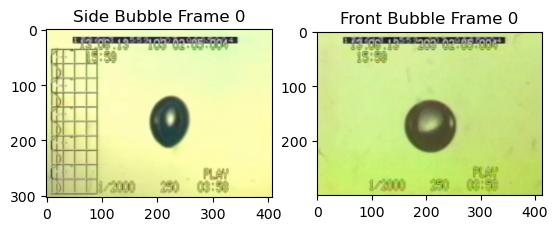

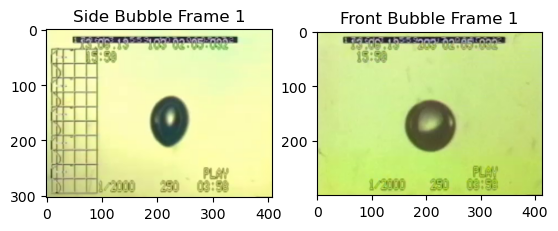

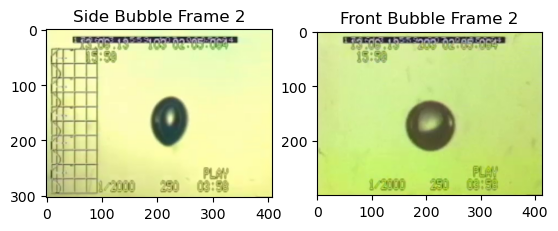

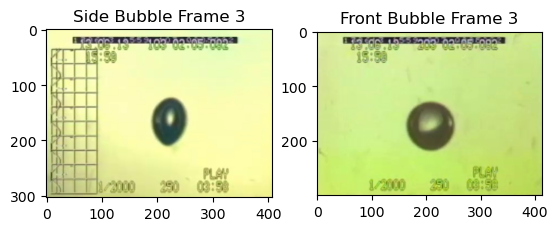

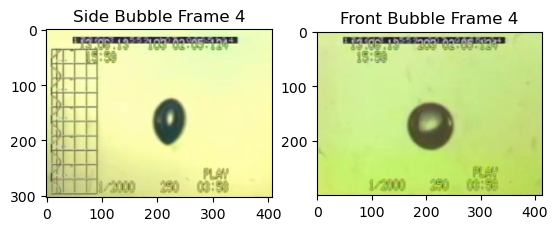

...

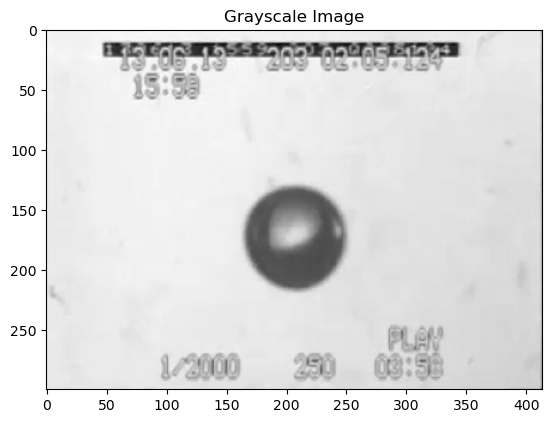

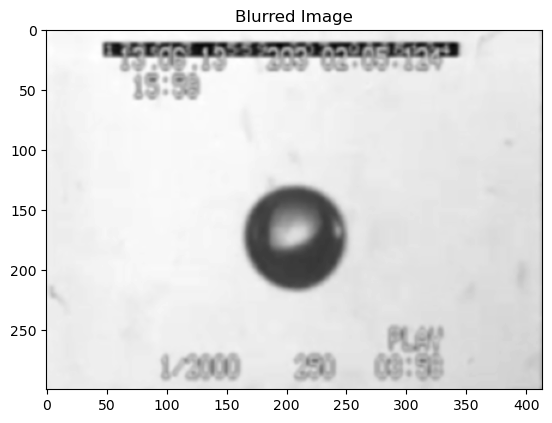

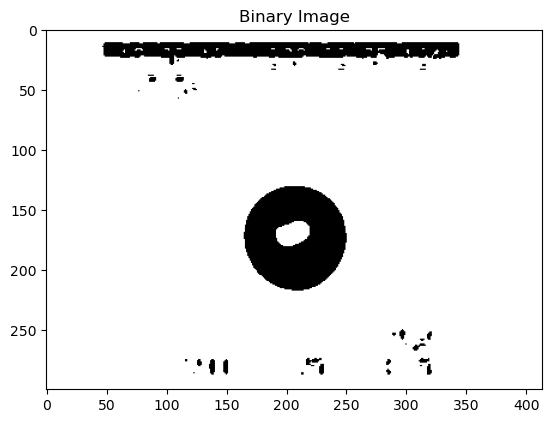

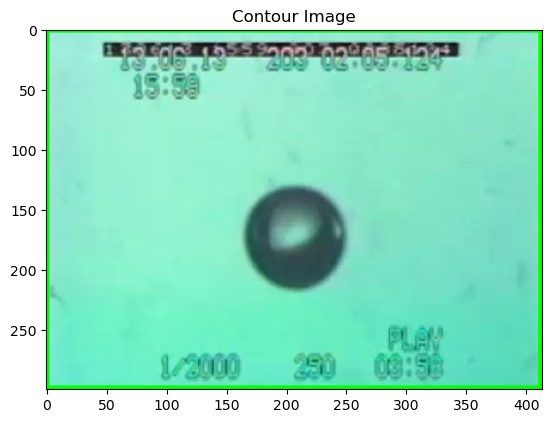

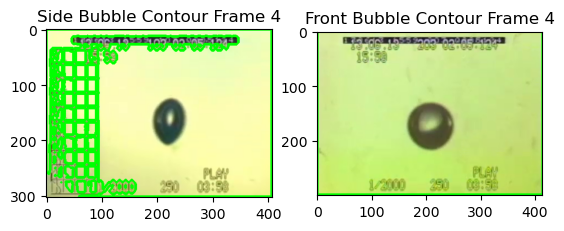

In [11]:
import cv2
import matplotlib.pyplot as plt

def select_roi(frame):
    """
    ユーザーによる手動でのROI選択。

    Args:
    frame: ROIを選択するための画像フレーム。

    Returns:
    選択されたROIの座標のタプル。
    """
    roi_side = cv2.selectROI("Select Side Bubble", frame, False, False)
    roi_front = cv2.selectROI("Select Front Bubble", frame, False, False)
    cv2.destroyAllWindows()
    return roi_side, roi_front

def process_video(video_path, roi_side, roi_front, num_frames=5):
    """
    選択されたROIを使用して動画を処理する。

    Args:
    video_path: 処理する動画ファイルのパス。
    roi_side: 側面の気泡のROI。
    roi_front: 正面の気泡のROI。

    Returns:
    処理されたフレームのリスト。
    """
    # 動画を読み込む
    cap = cv2.VideoCapture(video_path)
    processed_frames = []

    for _ in range(num_frames):
        ret, frame = cap.read()
        if not ret:
            break
        
        # 同じROIを使用して各フレームをクロップする
        side_x, side_y, side_w, side_h = roi_side
        front_x, front_y, front_w, front_h = roi_front
        cropped_side = frame[side_y:side_y+side_h, side_x:side_x+side_w]
        cropped_front = frame[front_y:front_y+front_h, front_x:front_x+front_w]
        
        # 処理されたフレームをリストに追加する
        processed_frames.append((cropped_side, cropped_front))
    # すべてのウィンドウを閉じる
    cap.release()
    return processed_frames

# 処理されたフレームの画像を表示する関数
def show_processed_frames(processed_frames):
    for i, (cropped_side, cropped_front) in enumerate(processed_frames):
        # 側面の気泡画像を表示
        plt.subplot(1, 2, 1)  # 1行2列のグリッドの最初の位置にプロット
        plt.imshow(cv2.cvtColor(cropped_side, cv2.COLOR_BGR2RGB))
        plt.title(f'Side Bubble Frame {i}')

        # 正面の気泡画像を表示
        plt.subplot(1, 2, 2)  # 1行2列のグリッドの2番目の位置にプロット
        plt.imshow(cv2.cvtColor(cropped_front, cv2.COLOR_BGR2RGB))
        plt.title(f'Front Bubble Frame {i}')

        plt.show()
        
def show_step_images(side_image, front_image, step_title):
    """
    画像処理の各ステップの結果を1行2列のグリッドに表示する関数です。

    Args:
    side_image: 側面の気泡画像。
    front_image: 正面の気泡画像。
    step_title: 現在の処理ステップのタイトル。
    """
    plt.figure(figsize=(12, 6))  # 図のサイズを設定

    # 側面の気泡画像を1行2列のグリッドの最初の位置にプロット
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(side_image, cv2.COLOR_BGR2RGB))
    plt.title(f'Side {step_title}')

    # 正面の気泡画像を1行2列のグリッドの2番目の位置にプロット
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(front_image, cv2.COLOR_BGR2RGB))
    plt.title(f'Front {step_title}')

    plt.show()

def detect_and_draw_contours_otsu(image, visualize_steps=True):
    """
    Otsuの方法を用いて自動二値化を行い、輪郭検出を行う関数です。

    Args:
    image: 輪郭検出を行う画像。
    visualize_steps: 各処理ステップの画像を表示するかどうかのフラグ。

    Returns:
    輪郭が描画された画像。
    """
    # グレースケール化
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # ノイズリダクション
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    
    # Otsuの方法による自動二値化
    _, binary = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    # 輪郭検出
    contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contour_image = cv2.drawContours(image.copy(), contours, -1, (0, 255, 0), 3)

    return contour_image

# この関数を呼び出す際には、visualize_steps=True を設定してください。

# 最初のフレームでROIを選択するために動画を読み込む
video_path = 'C:\\Users\\flow\\Desktop\\今さんデータ\\①扁平回転.mp4'
cap = cv2.VideoCapture(video_path)
ret, first_frame = cap.read()
if not ret:
    print("Failed to read the video")
else:
    # ROIを選択
    roi_side, roi_front = select_roi(first_frame)

    # 選択されたROIを使用して動画を処理
    processed_frames = process_video(video_path, roi_side, roi_front)
    print("Processed {} frames".format(len(processed_frames)))
    # print(processed_frames)
    show_processed_frames(processed_frames)
    # 輪郭検出を行い、結果を表示
    for i, (cropped_side, cropped_front) in enumerate(processed_frames):
        contour_side = detect_and_draw_contours_otsu(cropped_side)
        contour_front = detect_and_draw_contours_otsu(cropped_front)

        # 画像処理の各ステップの結果を表示
        show_step_images(contour_side, contour_front, 'Contours')
    

cap.release()
cv2.destroyAllWindows()


In [2]:
from PIL import Image
import os
import cv2

def save_first_frame_as_image(video_path, output_dir, image_name):
    """
    動画の最初のフレームを指定されたディレクトリに画像として保存する。

    Args:
    video_path (str): 動画ファイルのパス。
    output_dir (str): 保存するディレクトリのパス。
    image_name (str): 保存する画像ファイルの名前。

    Returns:
    画像の保存に成功したかどうかのブール値。
    """
    # 出力ディレクトリが存在しない場合は作成
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    output_image_path = os.path.join(output_dir, image_name)

    cap = cv2.VideoCapture(video_path)
    ret, frame = cap.read()
    if not ret:
        return False

    cv2.imwrite(output_image_path, frame)
    cap.release()
    return True

# 使用例
video_path = 'C:\\Users\\flow\\Desktop\\今さんデータ\\①扁平回転.mp4'
output_dir = 'C:\\Users\\flow\\Desktop\\bubble_rasing_result\\output_images\\'
image_name = 'first_frame.jpg'
if save_first_frame_as_image(video_path, output_dir, image_name):
    print("First frame saved as image.")
    image_path = os.path.join(output_dir, image_name)
else:
    print("Failed to save first frame.")
    
dpi = 96  # 画像のDPI
mm_per_inch = 25.4  # 1インチあたりのミリメートル数
mm_per_pixel = mm_per_inch / dpi

print(f"1 pixel is {mm_per_pixel} mm")



First frame saved as image.
1 pixel is 0.26458333333333334 mm


First frame saved as image.
1 pixel is 0.26458333333333334 mm
29.97002997002997
Processed 3 frames
front Image - Contour #0: Circularity = 0.16
front Image - Contour #1: Circularity = 0.90
front Image - Contour #2: Circularity = 0.61
side Image - Contour #0: Circularity = 0.77
side Image - Contour #1: Circularity = 0.89
side Image - Contour #2: Circularity = 0.13
front Image - Contour #0: Circularity = 0.12
front Image - Contour #1: Circularity = 0.91
front Image - Contour #2: Circularity = 0.26
side Image - Contour #0: Circularity = 0.77
side Image - Contour #1: Circularity = 0.90
side Image - Contour #2: Circularity = 0.12
front Image - Contour #0: Circularity = 0.14
front Image - Contour #1: Circularity = 0.91
front Image - Contour #2: Circularity = 0.36
side Image - Contour #0: Circularity = 0.77
side Image - Contour #1: Circularity = 0.90
side Image - Contour #2: Circularity = 0.12
Side Bubble Circularities: Min = 0.8903235081480052, Max = 0.9032956701723729, Avg = 0.8981040268268

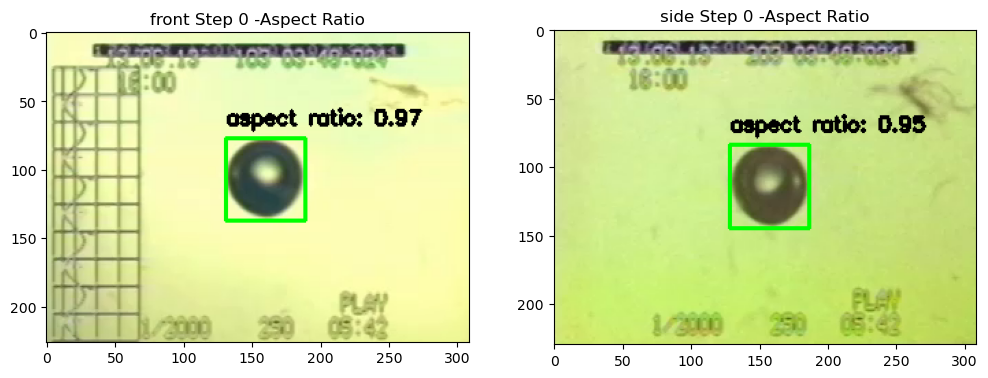

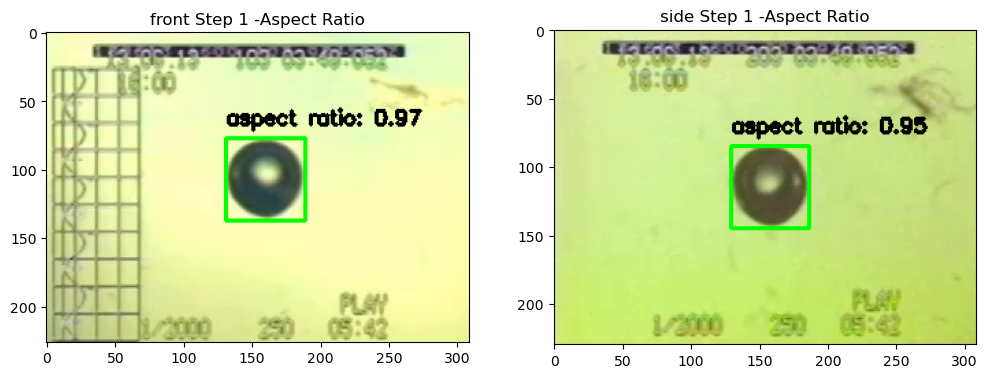

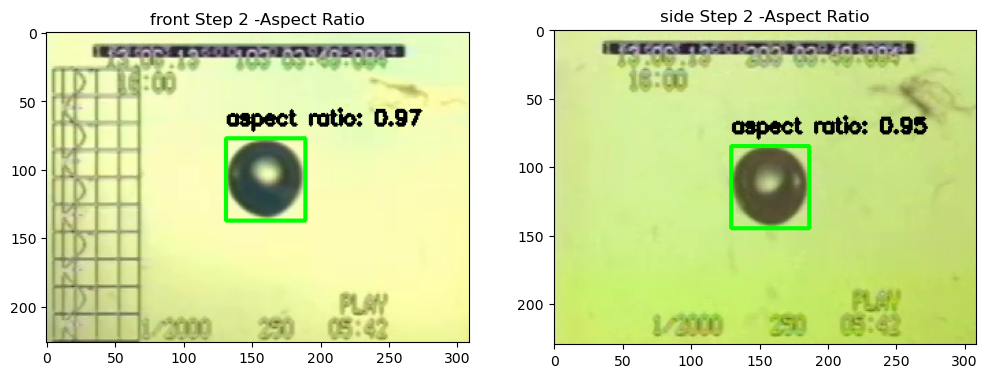

In [38]:

import numpy as np
import cv2
import matplotlib.pyplot as plt
import math
import os

def save_first_frame_as_image(video_path, output_dir, image_name):
    """
    動画の最初のフレームを指定されたディレクトリに画像として保存する。

    Args:
    video_path (str): 動画ファイルのパス。
    output_dir (str): 保存するディレクトリのパス。
    image_name (str): 保存する画像ファイルの名前。

    Returns:
    画像の保存に成功したかどうかのブール値。
    """
    # 出力ディレクトリが存在しない場合は作成
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    output_image_path = os.path.join(output_dir, image_name)

    cap = cv2.VideoCapture(video_path)
    ret, frame = cap.read()
    if not ret:
        return False

    cv2.imwrite(output_image_path, frame)
    cap.release()
    return True

# 使用例
video_path = 'C:\\Users\\flow\\Desktop\\今さんデータ\\①扁平回転.mp4'
output_dir = 'C:\\Users\\flow\\Desktop\\bubble_rasing_result\\output_images\\'
image_name = 'first_frame.jpg'
if save_first_frame_as_image(video_path, output_dir, image_name):
    print("First frame saved as image.")
    image_path = os.path.join(output_dir, image_name)
else:
    print("Failed to save first frame.")
    
dpi = 96  # 画像のDPI
mm_per_inch = 25.4  # 1インチあたりのミリメートル数
mm_per_pixel = mm_per_inch / dpi

print(f"1 pixel is {mm_per_pixel} mm")


def get_frame_rate(video_path):
    """
    ビデオファイルからフレームレートを取得する。

    Args:
    video_path: ビデオファイルのパス。

    Returns:
    フレームレート（秒あたりのフレーム数）。
    """
    # ビデオを読み込む
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        raise ValueError("ビデオファイルを開けませんでした。")

    # フレームレートを取得
    frame_rate = cap.get(cv2.CAP_PROP_FPS)
    cap.release()
    return frame_rate

def select_roi(frame):
    """
    ユーザーによる手動でのROI選択。

    Args:
    frame: ROIを選択するための画像フレーム。

    Returns:
    選択されたROIの座標のタプル。
    """
    roi_front = cv2.selectROI("Select front Bubble", frame, False, False)
    roi_side = cv2.selectROI("Select side Bubble", frame, False, False)
    cv2.destroyAllWindows()
    return roi_front, roi_side

def process_video(video_path, roi_front, roi_side, num_frames=3):
    """
    選択されたROIを使用して動画を処理する。

    Args:
    video_path: 処理する動画ファイルのパス。
    roi_front: 側面の気泡のROI。
    roi_side: 正面の気泡のROI。
    num_frames: 処理するフレームの数（オプション、指定しない場合はすべてのフレームを処理する）。

    Returns:
    処理されたフレームのリスト。
    """
    # 動画を読み込む
    cap = cv2.VideoCapture(video_path)
    processed_frames = []

    frame_count = 0
    while True:
        ret, frame = cap.read()
        if not ret:
            break

        if num_frames is not None and frame_count >= num_frames:
            break
        
        # 同じROIを使用して各フレームをクロップする
        front_x, front_y, front_w, front_h = roi_front
        side_x, side_y, side_w, side_h = roi_side
        cropped_front = frame[front_y:front_y+front_h, front_x:front_x+front_w]
        cropped_side = frame[side_y:side_y+side_h, side_x:side_x+side_w]
        
        # 処理されたフレームをリストに追加する
        processed_frames.append((cropped_front, cropped_side))

        frame_count += 1

    # すべてのウィンドウを閉じる
    cap.release()
    return processed_frames

def show_processed_frames(processed_frames):
    for i, (cropped_front, cropped_side) in enumerate(processed_frames):
        plt.figure(figsize=(12, 6))  # 図のサイズを設定
        # 側面の気泡画像を表示
        plt.subplot(1, 2, 1)  # 1行2列のグリッドの最初の位置にプロット
        plt.imshow(cv2.cvtColor(cropped_front, cv2.COLOR_BGR2RGB))
        plt.title(f'front Bubble Frame {i}')

        # 正面の気泡画像を表示
        plt.subplot(1, 2, 2)  # 1行2列のグリッドの2番目の位置にプロット
        plt.imshow(cv2.cvtColor(cropped_side, cv2.COLOR_BGR2RGB))
        plt.title(f'side Bubble Frame {i}')

        plt.show()


def visualize_contours_with_area(image, contours, image_type):
    """
    画像に輪郭とその面積を描画し、コンソールに輪郭の情報を出力します。

    Args:
    image: 輪郭を描画する画像。
    contours: 輪郭のリスト。
    image_type: 画像のタイプ（'front' または 'Front'）。

    Returns:
    輪郭が描画された画像。
    """
    # 面積計算とソート
    contours_with_area = [(cv2.contourArea(c), c) for c in contours]
    contours_with_area.sort(reverse=True, key=lambda x: x[0])
    filtered_contours = []
    # 番号付けと描画、そしてコンソールへの出力
    for i, (area, contour) in enumerate(contours_with_area):
        if i < 3:  # 最大面積の輪郭から3個を表示
            # 輪郭のバウンディングボックスを取得
            x, y, w, h = cv2.boundingRect(contour)
            cv2.drawContours(image, [contour], -1, (0, 255, 0), 2)
            
            # テキストの描画位置（バウンディングボックスの上部）
            text_position = (x+50, y+15)
            text = f"{i}: {area}"
            cv2.putText(image, text, text_position, cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)
            # print(f"{image_type} Image - Contour #{i}: Area = {area}, Bounding Box = ({x}, {y}, {w}, {h})")
            filtered_contours.append(contour)
            
    return image,filtered_contours

def calculate_circularity(contour):
    area = cv2.contourArea(contour)
    perimeter = cv2.arcLength(contour, True)
    if perimeter == 0:
        return 0
    circularity = 4 * np.pi * (area / (perimeter ** 2))
    return circularity

def determine_max_circularity(contours, image_type):
    """
    与えられた輪郭の中で最も円形度が高いものを選択し、その円形度を出力する。

    Args:
    contours: 輪郭のリスト。
    image_type: 輪郭のタイプ（'front' または 'Front'）。

    Returns:
    最も円形度が高い輪郭とその円形度。
    """
    # 各輪郭の円形度を計算
    circularity_contours = [(calculate_circularity(c), c) for c in contours]

    # 円形度のリストのみを抽出
    circularities = [c[0] for c in circularity_contours]

    # 各輪郭の円形度とタイプを出力
    for i, circularity in enumerate(circularities):
        print(f"{image_type} Image - Contour #{i}: Circularity = {circularity:.2f}")

    # 円形度が最大の輪郭を見つける
    max_circularity, max_contour = max(circularity_contours, key=lambda x: x[0])

    # 最大の円形度を持つ輪郭の情報を出力
    # print(f"{image_type} Image - Max Circularity: {max_circularity:.2f}")

    return max_contour, max_circularity

def visualize_max_circularity_contour(image, contour, circularity, image_type):
    """
    画像に最も円形度が高い輪郭とその面積、円形度を描画します。

    Args:
    image: 輪郭を描画する画像。
    contour: 最も円形度が高い輪郭。
    circularity: 輪郭の円形度。
    image_type: 画像のタイプ（'front' または 'Front'）。

    Returns:
    更新された画像。
    """
    # 輪郭の面積を計算
    area = cv2.contourArea(contour)

    # 輪郭のバウンディングボックスを取得
    x, y, w, h = cv2.boundingRect(contour)

    # 輪郭を画像に描画
    cv2.drawContours(image, [contour], -1, (0, 255, 0), 2)

    # 面積と円形度の情報をテキストとして描画
    text1 = f"Area: {area:.2f}"
    text2 = f"Circularity: {circularity:.2f}"
    cv2.putText(image, text1, (x, y - 40), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)
    cv2.putText(image, text2, (x, y - 20), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 0), 2)
    # 輪郭の情報を出力
    # print(f"{image_type} Image - Contour Area: {area:.2f}, Circularity: {circularity:.2f}")

    return image


def show_step_images(front_image, side_image, step_title):
    """
    画像処理の各ステップの結果を1行2列のグリッドに表示する関数です。

    Args:
    front_image: 正面の気泡画像。
    side_image: 側面の気泡画像。
    step_title: 現在の処理ステップのタイトル。
    """
    plt.figure(figsize=(12, 6))  # 図のサイズを設定

    # 側面の気泡画像を1行2列のグリッドの最初の位置にプロット
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(front_image, cv2.COLOR_BGR2RGB))
    plt.title(f'front {step_title}')

    # 正面の気泡画像を1行2列のグリッドの2番目の位置にプロット
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(side_image, cv2.COLOR_BGR2RGB))
    plt.title(f'side {step_title}')

    plt.show()

# 画像保存する
def create_and_save_images(front_gray, side_gray, output_base_dir, step_name, file_name):
    # ステップごとのディレクトリを作成
    step_dir = os.path.join(output_base_dir, step_name)
    if not os.path.exists(step_dir):
        os.makedirs(step_dir)

    # front_gray と side_gray の高さを統一する
    desired_height = front_gray.shape[0]  # front_gray の高さを基準にする
    side_gray_resized = cv2.resize(side_gray, (side_gray.shape[1], desired_height))

    # front_gray と side_gray を横に連結
    concatenated_image = np.hstack((front_gray, side_gray_resized))

    # 画像を保存
    file_path = os.path.join(step_dir, file_name)
    cv2.imwrite(file_path, concatenated_image)

def process_and_visualize_steps(processed_frames, visualize_steps=True):
    """
    動画の各フレームに対して画像処理を行い、必要に応じて処理のステップを可視化します。

    Args:
    processed_frames: 処理するフレームのリスト（側面と正面の画像のペア）。
    output_dir: 画像を保存するベースディレクトリ。
    visualize_steps: 処理のステップを可視化するかどうか。

    Returns:
    処理されたフレームのリストと各ステップの画像。
    """
    
    
    processed_images = []
    side_contours_list = []  # 側面の気泡の輪郭リスト
    front_contours_list = []  # 正面の気泡の輪郭リスト
    # 使用例
    output_base_dir = 'C:\\Users\\flow\\Desktop\\master_thesis_data\\'
    for i, (cropped_front, cropped_side) in enumerate(processed_frames):
        steps_images = {}
        
        # グレースケール化
        front_gray = cv2.cvtColor(cropped_front, cv2.COLOR_BGR2GRAY)
        side_gray = cv2.cvtColor(cropped_side, cv2.COLOR_BGR2GRAY)
        step_name = "gray"
        # ファイル名を生成
        file_name = f'gray{i}.bmp'
        create_and_save_images(front_gray, side_gray, output_base_dir, step_name, file_name)
        
        # ノイズリダクション
        front_blurred = cv2.GaussianBlur(front_gray, (5, 5), 0)
        side_blurred = cv2.GaussianBlur(side_gray, (5, 5), 0)
        step_name = "blurred"
        file_name = f'blurred{i}.bmp'
        create_and_save_images(front_blurred, side_blurred, output_base_dir, step_name, file_name)
        
        
        # 二値化
        _, front_binary = cv2.threshold(front_blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
        _, side_binary = cv2.threshold(side_blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
        step_name = "binary"
        file_name = f'blurred{i}.bmp'
        create_and_save_images(front_binary,side_binary, output_base_dir, step_name, file_name)

        # 輪郭検出
        front_contours, _ = cv2.findContours(front_binary, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
        side_contours, _ = cv2.findContours(side_binary, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
        
        # 輪郭を描画
        front_contour_image = cv2.drawContours(cropped_front.copy(), front_contours, -1, (0, 255, 0), 2)
        side_contour_image = cv2.drawContours(cropped_side.copy(), side_contours, -1, (0, 255, 0), 2)
        step_name = "contour"
        file_name = f'contour{i}.bmp'
        create_and_save_images(front_contour_image, side_contour_image, output_base_dir, step_name, file_name)
        
        # 側面と正面の画像に対して面積フィルタリング関数を適用
        front_processed_image, front_filtered_contours = visualize_contours_with_area(cropped_front.copy(), front_contours, "front")
        side_processed_image, side_filtered_contours = visualize_contours_with_area(cropped_side.copy(), side_contours, "side")
        step_name = "contours_with_area"
        file_name = f'contours_with_area{i}.bmp'
        create_and_save_images(front_processed_image,side_processed_image, output_base_dir, step_name, file_name)
        
        
        # 最も円形度が高い輪郭を特定
        max_front_contour, max_circularity_front = determine_max_circularity(front_filtered_contours, "front")
        max_side_contour, max_circularity_side = determine_max_circularity(side_filtered_contours, "side")
        
        
        # 最も円形度が高い輪郭とその面積、円形度を描画
        front_final_image = visualize_max_circularity_contour(cropped_front.copy(), max_front_contour, max_circularity_front, "front")
        side_final_image = visualize_max_circularity_contour(cropped_side.copy(), max_side_contour, max_circularity_side, "side")
        step_name = "max_circularity_contour"
        file_name = f'max_circularity_contour{i}.bmp'
        create_and_save_images(front_final_image, side_final_image, output_base_dir, step_name, file_name)
        
        
        # 最も円形度が高い輪郭をリストに追加
        front_contours_list.append(max_front_contour)
        side_contours_list.append(max_side_contour)
        
        # 可視化
        # if visualize_steps:
        #     show_step_images(front_gray, side_gray, f'Grayscale Frame {i}')
        #     show_step_images(front_blurred, side_blurred, f'Blurred Frame {i}')
        #     show_step_images(front_binary,side_binary, f'Binary Frame {i}')
        #     show_step_images(front_contour_image, side_contour_image, f'Contours Frame {i}')
        #     show_step_images(front_processed_image, side_processed_image, f'Contours Frame with Area Frame {i}')
        #     show_step_images(front_final_image, side_final_image, f'contours_with_circularity {i}')

        # 結果を辞書に格納
        steps_images['Grayscale'] = (front_gray, side_gray)
        steps_images['Blurred'] = (front_blurred, side_blurred)
        steps_images['Binary'] = (front_binary, side_binary)
        steps_images['Contours'] = (front_contour_image, side_contour_image)
        steps_images['Contours Frame with Area Frame'] = (front_processed_image, side_processed_image)
        steps_images['contours_with_circularity'] = ( front_final_image, side_final_image)
        processed_images.append(steps_images)

    return processed_images, front_contours_list, side_contours_list


# これ以降データ解析系の処理
# ピクセル値からミリメートルに変換する関数
def pixels_to_mm(pixels):
    return pixels * mm_per_pixel

def calculate_areas(contours):
    """
    複数の輪郭の面積を計算する。

    Args:
    contours: 輪郭データのリスト。

    Returns:
    各輪郭の面積のリスト。
    """
    areas = []
    for contour in contours:
        area_pixels = cv2.contourArea(contour)
        area_mm2 = pixels_to_mm(area_pixels)  # ピクセルからミリメートルに変換
        areas.append(area_mm2)
    return areas

def calculate_perimeters(contours):
    """
    複数の輪郭の周囲長を計算する。

    Args:
    contours: 輪郭データのリスト。

    Returns:
    各輪郭の周囲長のリスト。
    """
    perimeters = []
    for contour in contours:
        perimeter_pixels = cv2.arcLength(contour, True)  # ピクセル単位の周囲長
        perimeter_mm = pixels_to_mm(perimeter_pixels)  # ピクセルからミリメートルに変換
        perimeters.append(perimeter_mm)
    return perimeters


#  円形度関数はすでに定義されています。
def calculate_circularity_list(contours):
    """
    複数の輪郭の円形度を計算する。

    Args:
    contours: 輪郭データのリスト。

    Returns:
    各輪郭の円形度のリスト。
    """
    circularities = []
    for contour in contours:
        area = cv2.contourArea(contour)
        perimeter = cv2.arcLength(contour, True)
        if perimeter == 0:
            circularity = 0
        else:
            circularity = 4 * np.pi * (area / (perimeter ** 2))
        circularities.append(circularity)
    return circularities

def calculate_diameters(contours):
    """
    複数の輪郭データから気泡の長径と短径を計算する。

    Args:
    contours: 輪郭データのリスト。

    Returns:
    各輪郭の長径と短径のタプルのリスト。
    """
    diameters = []
    for contour in contours:
        _, _, w, h = cv2.boundingRect(contour)
        long_diameter = max(w, h)
        short_diameter = min(w, h)
        w_mm = pixels_to_mm(long_diameter)  # ピクセルからミリメートルに変換
        h_mm = pixels_to_mm(short_diameter) 
        diameters.append(( w_mm, h_mm))
    return diameters

# 気泡直径の計測
def calculate_diameters_list(contours):
    """
    複数の輪郭データから気泡の直径を計算する。

    Args:
    contours: 輪郭データのリスト。

    Returns:
    各輪郭の直径のリスト。
    """
    diameters_list = []
    for contour in contours:
        _, _, w, h = cv2.boundingRect(contour)
        diameter_pixels = max(w, h)  # 気泡が完全な円形でない場合、最大の寸法を直径として使用
        diameter_mm = diameter_pixels * mm_per_pixel
        diameters_list.append(diameter_mm)
    return diameters_list

# 球の定義の閾値を決めるため
def calculate_circularity_statistics(contours):
    circularities = [calculate_circularity(contour) for contour in contours]
    min_circularity = min(circularities)
    max_circularity = max(circularities)
    avg_circularity = sum(circularities) / len(circularities)
    return min_circularity, max_circularity, avg_circularity

def calculate_bubble_volumes(contours, circularity_threshold=0.88):
    """
    複数の輪郭に基づいて各気泡の体積を計算する。

    Args:
    contours: 輪郭データのリスト。
    circularity_threshold: 真球と楕円を区別するための円形度の閾値。

    Returns:
    各輪郭の体積のリスト。
    """
    volumes = []
    for contour in contours:
        circularity = calculate_circularity(contour)
        if circularity >= circularity_threshold:
            volume = calculate_volume_sphere(contour)
        else:
            volume = calculate_volume_ellipse(contour)
        volumes.append(volume)
    return volumes
    
def calculate_volume_sphere(contour):
    """
    球形気泡の体積を計算する。

    Args:
    contour: 輪郭データ。

    Returns:
    体積。
    """
    _, _, w, h = cv2.boundingRect(contour)
    diameter_pixels = max(w, h)
    radius_pixels = diameter_pixels / 2
    radius_mm = radius_pixels * mm_per_pixel
    volume = (4/3) * np.pi * (radius_mm ** 3)
    return volume

def calculate_volume_ellipse(contour):
    """
    楕円形気泡の体積を計算する。

    Args:
    contour: 輪郭データ。

    Returns:
    体積。
    """
    _, _, w, h = cv2.boundingRect(contour)
    a_pixels = w / 2
    b_pixels = h / 2
    a_mm = a_pixels * mm_per_pixel
    b_mm = b_pixels * mm_per_pixel
    volume = (4/3) * np.pi * a_mm * b_mm * min(a_mm, b_mm)
    return volume

def calculate_centroids(contours):
    """
    複数の輪郭の重心を計算する。

    Args:
    contours: 輪郭データのリスト。

    Returns:
    各輪郭の重心座標のリスト。
    """
    centroids = []
    for contour in contours:
        M = cv2.moments(contour)
        if M["m00"] != 0:
            cx = int(M["m10"] / M["m00"])
            cy = int(M["m01"] / M["m00"])
        else:
            cx, cy = 0, 0
        centroids.append((cx, cy))
    return centroids

def calculate_bubble_rise_speed(centroid_list, frame_rate):
    """
    各フレーム間での気泡の上昇速度を計算する。

    Args:
    centroid_list: 各フレームの重心座標のリスト。
    frame_rate: ビデオのフレームレート。

    Returns:
    各フレーム間の上昇速度のリスト（ピクセル/秒）。
    """
    rise_speeds = []
    for i in range(len(centroid_list) - 1):
        x1, y1 = centroid_list[i]
        x2, y2 = centroid_list[i + 1]
        # 2点間の距離を計算
        distance_pixels = np.sqrt((x2 - x1)**2 + (y2 - y1)**2)
        # 時間間隔（秒）を計算
        time_interval = 1 / frame_rate
        # 上昇速度（ピクセル/秒）
        speed = distance_pixels / time_interval
        # 上昇速度（ミリメートル/秒）＝距離（ミリメートル） / 時間（秒）
        speed_mm_per_sec = distance_pixels * mm_per_pixel / time_interval
        rise_speeds.append(speed_mm_per_sec)
    return rise_speeds

def draw_bounding_box(image, contour):
    """
    画像に輪郭のバウンディングボックスを描画し、その縦横比を計算してテキストとしても出力する。

    Args:
    image: 輪郭を描画する元の画像。
    contour: 輪郭データ。

    Returns:
    バウンディングボックスが描画された画像と縦横比。
    """
    # バウンディングボックスを取得
    x, y, w, h = cv2.boundingRect(contour)
    aspect_ratio = w / h
    
    # バウンディングボックスを描画
    cv2.rectangle(image, (x, y), (x+w, y+h), (0, 255, 0), 2)
    
    # 縦横比をテキストとして描画
    text = f"aspect ratio: {aspect_ratio:.2f}"
    cv2.putText(image, text, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 0), 2)
    
    # 縦横比をコンソールに出力
    # print(text)
    
    return image, aspect_ratio


# 時間間隔の計算
def calculate_time_interval(frame_rate):
    return 1.0 / frame_rate  # 秒単位の時間間隔

# 剪断速度の計算
def calculate_shear_rate(diameters, time_interval):
    shear_rates = []
    for i in range(1, len(diameters)):
        delta_d = diameters[i] - diameters[i-1]
        shear_rate = delta_d / time_interval
        shear_rates.append(shear_rate)
    return shear_rates

# 曲率算出
def calculate_curvature(contour, image):
    # 曲線を多角形近似で単純化
    approx = cv2.approxPolyDP(contour, 0.02 * cv2.arcLength(contour, True), True)
    
    # 曲率を格納するリスト
    curvatures = []

    # 近似された曲線の各点に対して曲率を計算
    for i in range(1, len(approx) - 1):
        p1 = approx[i - 1][0]
        p2 = approx[i][0]
        p3 = approx[i + 1][0]

        # 2ベクトル間の角度を計算
        angle = np.abs(np.arctan2(p3[1] - p2[1], p3[0] - p2[0]) - np.arctan2(p2[1] - p1[1], p2[0] - p1[0]))

        # 曲率を計算（半径の逆数）
        curvature = np.abs(1 / (2 * np.sin(angle / 2)))
        curvatures.append(curvature)

    # 近似された輪郭の点を描画
    for p in approx:
        cv2.circle(image, tuple(p[0]), 3, (0, 255, 0), -1)
    
    # 近似された輪郭を描画
    cv2.polylines(image, [approx], True, (255, 0, 0), 2)

    # 描画された画像を表示
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title("Approximated Contour")
    plt.show()

    return curvatures

# 回転角度算出
def calculate_and_draw_ellipses(contours, image):
    """
    複数の輪郭に基づいて楕円を計算し、画像に描画する。

    Args:
    contours: 輪郭データのリスト。
    image: 描画する元の画像。

    Returns:
    描画された画像と、各楕円の中心座標、長径、短径、傾斜角のリスト。
    """
    ellipse_params = []
    for contour in contours:
        ellipse = cv2.fitEllipse(contour)
        cv2.ellipse(image, ellipse, (0, 255, 0), 2)  # 楕円を描画

        center = ellipse[0]
        axes = ellipse[1]
        rotation_angle = ellipse[2]
        long_axis = max(axes)
        short_axis = min(axes)

        ellipse_params.append((center, long_axis, short_axis, rotation_angle))

    return image, ellipse_params

# 最初のフレームでROIを選択するために動画を読み込む
video_path = 'C:\\Users\\flow\\Desktop\\今さんデータ\\②球形で膨張・収縮.mp4'
cap = cv2.VideoCapture(video_path)
fps = get_frame_rate(video_path)
print(fps)
ret, first_frame = cap.read()
if not ret:
    print("Failed to read the video")
else:
    # ROIを選択する
    roi_front, roi_side = select_roi(first_frame)

    # 選択されたROIを使用して動画を処理
    processed_frames = process_video(video_path, roi_front, roi_side)
    print("Processed {} frames".format(len(processed_frames)))
    # print(processed_frames)
    # show_processed_frames(processed_frames)  
    
    processed_images, front_contours_list, side_contours_list = process_and_visualize_steps(processed_frames, visualize_steps=True)


# 解析
# 側面の気泡について円形度の統計を計算
side_min_circularity, side_max_circularity, side_avg_circularity = calculate_circularity_statistics(side_contours_list)

# 正面の気泡について円形度の統計を計算
front_min_circularity, front_max_circularity, front_avg_circularity = calculate_circularity_statistics(front_contours_list)

# 結果を表示
print(f"Side Bubble Circularities: Min = {side_min_circularity}, Max = {side_max_circularity}, Avg = {side_avg_circularity}")
print(f"Front Bubble Circularities: Min = {front_min_circularity}, Max = {front_max_circularity}, Avg = {front_avg_circularity}")

# processed_frames内の各フレームに対して処理を行う
output_base_dir = 'C:\\Users\\flow\\Desktop\\master_thesis_data\\'
for i, (cropped_front, cropped_side) in enumerate(processed_frames):
    # 正面画像に対してバウンディングボックスを描画し縦横比を計算
    front_contour = front_contours_list[i]  # 正面の輪郭情報を取得
    front_image_with_box, front_aspect_ratio = draw_bounding_box(cropped_front.copy(), front_contour)
    
    # 側面画像に対してバウンディングボックスを描画し縦横比を計算
    side_contour = side_contours_list[i]  # 側面の輪郭情報を取得
    side_image_with_box, side_aspect_ratio = draw_bounding_box(cropped_side.copy(), side_contour)
    
    # バウンディングボックスが描画された画像と縦横比を用いてデータ解析を行う
    # ここにデータ解析のコードを追加してください

    # 解析結果を表示
    step_title = f'Step {i} -Aspect Ratio'
    show_step_images(front_image_with_box, side_image_with_box, step_title)

    # 解析結果を保存
    step_name = 'bounding_box'
    file_name = f'bounding_box_{i}.bmp'
    create_and_save_images(front_image_with_box, side_image_with_box, output_base_dir, step_name, file_name)



In [ ]:
def analyze_contour_data(image, contour):
    """
    輪郭データに基づいて複数の特徴量を計算する。

    Args:
    contour: 輪郭データ。

    Returns:
    特徴量の辞書。
    """
    # 特徴量を計算
    area = calculate_area(contour)
    perimeter = calculate_perimeter(contour)
    circularity = calculate_circularity(contour)
    centroid = calculate_centroid(contour)
    
    # バウンディングボックスを描画
    image_with_bbox, aspect_ratio = draw_bounding_box(image, contour)
    
    # 描画された画像を表示
    plt.imshow(cv2.cvtColor(image_with_bbox, cv2.COLOR_BGR2RGB))
    plt.title("Image with Bounding Box")
    plt.show()

    # 特徴量を辞書に格納
    features = {
        "area": area,
        "perimeter": perimeter,
        "circularity": circularity,
        "centroid_x": centroid[0],
        "centroid_y": centroid[1]
    }

    return features
    